# Libraries

In [220]:
import pandas as pd
import numpy as np
from datetime import datetime
import re
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Loading Datasets

In [2]:
retail_df = pd.read_csv('D:/Uni Work/SEM5/DAV/Assignment 01/Retail Transaction Dataset Kaggle.csv')

retail_df

,CustomerID,ProductID,Quantity,Price,TransactionDate,PaymentMethod,StoreLocation,ProductCategory,DiscountApplied(%),TotalAmount
0,109318,C,7,80.079844,12/26/2023 12:32,Cash,"176 Andrew Cliffs\nBaileyfort, HI 93354",Books,18.677100,455.862764
1,993229,C,4,75.195229,8/5/2023 0:00,Cash,"11635 William Well Suite 809\nEast Kara, MT 19483",Home Decor,14.121365,258.306546
2,579675,A,8,31.528816,3/11/2024 18:51,Cash,"910 Mendez Ville Suite 909\nPort Lauraland, MO...",Books,15.943701,212.015651
3,799826,D,5,98.880218,10/27/2023 22:00,PayPal,"87522 Sharon Corners Suite 500\nLake Tammy, MO...",Books,6.686337,461.343769
4,121413,A,7,93.188512,12/22/2023 11:38,Cash,"0070 Michelle Island Suite 143\nHoland, VA 80142",Electronics,4.030096,626.030484
...,...,...,...,...,...,...,...,...,...,...
99995,726461,A,2,56.078258,7/17/2023 16:59,Credit Card,"3632 Darren Station Apt. 553\nEricaborough, RI...",Clothing,18.345145,91.581240
99996,328056,A,6,88.516406,5/30/2023 9:04,Credit Card,"821 Taylor Shoals\nEvansville, IL 70845",Electronics,3.995541,509.878179
99997,887304,B,4,72.385564,8/25/2023 7:59,Credit Card,"50653 Kara Lakes\nStephanieborough, RI 94492",Clothing,17.423979,239.092472
99998,326401,C,5,66.542239,2/5/2024 19:45,PayPal,"18756 Mcfarland Way Suite 866\nBarnettside, PR...",Electronics,14.345018,284.983717


In [3]:
online_retail_df = pd.read_excel('D:/Uni Work/SEM5/DAV/Assignment 01/Online Retail UCI.xlsx')

online_retail_df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France


In [4]:
ecommerce_df = pd.read_csv('D:/Uni Work/SEM5/DAV/Assignment 01/ecommerce data world.csv',encoding='ISO-8859-1')

ecommerce_df

,_unit_id,relevance,relevance:variance,product_image,product_link,product_price,product_title,query,rank,source,url,product_description
0,711158459,3.67,0.471,http://thumbs2.ebaystatic.com/d/l225/m/mzvzEUI...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$329.98,Sony PlayStation 4 (PS4) (Latest Model)- 500 G...,playstation 4,1,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...
1,711158460,4.00,0.000,http://thumbs3.ebaystatic.com/d/l225/m/mJNDmSy...,http://www.ebay.com/itm/Sony-PlayStation-4-Lat...,$324.84,Sony PlayStation 4 (Latest Model)- 500 GB Jet ...,playstation 4,2,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...
2,711158461,4.00,0.000,http://thumbs4.ebaystatic.com/d/l225/m/m10NZXA...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$324.83,Sony PlayStation 4 PS4 500 GB Jet Black Console,playstation 4,3,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...
3,711158462,3.67,0.471,http://thumbs2.ebaystatic.com/d/l225/m/mZZXTmA...,http://www.ebay.com/itm/Sony-PlayStation-4-500...,$350.00,Sony - PlayStation 4 500GB The Last of Us Rema...,playstation 4,4,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,NaN
4,711158463,3.33,0.471,http://thumbs3.ebaystatic.com/d/l225/m/mzvzEUI...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$308.00\nTrending at\n$319.99,Sony PlayStation 4 (PS4) (Latest Model)- 500 G...,playstation 4,5,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...
...,...,...,...,...,...,...,...,...,...,...,...,...
32666,713196633,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1265775653-xinternal...,"$109.99,Sale $74.95",Kamik Gamma2 Snow Boots (For Women),snow boots,30,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,Closeouts. Perfect for burly winter days where...
32667,713196634,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1262233377-xinternal...,$175.00,Hunter Rain Boots - Tour Neoprene,snow boots,31,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,"Dive into rainy days in these look-great, feel..."
32668,713196635,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1265775377-xinternal...,"$175.00,Sale $119.95",Blondo Steffy Snow Boots - Waterproof (For Women),snow boots,32,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,NaN
32669,713196636,NaN,NaN,http://edge.shop.com/ccimg.shop.com/250000/250...,http://www.shop.com/nbts/p957783018-xinternals...,$169.00,Maine Pac Boots,snow boots,33,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,Vintage style meets cold weather comfort to cr...


# Pre-Processing

In [5]:
online_retail_df['UnitPrice'].describe()

count    541909.000000
mean          4.611114
std          96.759853
min      -11062.060000
25%           1.250000
50%           2.080000
75%           4.130000
max       38970.000000
Name: UnitPrice, dtype: float64

In [6]:
online_retail_df = online_retail_df[online_retail_df['UnitPrice'] > 0]

online_retail_df['UnitPrice'].describe()


count    539392.000000
mean          4.673648
std          94.614722
min           0.001000
25%           1.250000
50%           2.080000
75%           4.130000
max       38970.000000
Name: UnitPrice, dtype: float64

In [7]:
online_retail_df.head(50)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
5,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,2010-12-01 08:26:00,7.65,17850.0,United Kingdom
6,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,2010-12-01 08:26:00,4.25,17850.0,United Kingdom
7,536366,22633,HAND WARMER UNION JACK,6,2010-12-01 08:28:00,1.85,17850.0,United Kingdom
8,536366,22632,HAND WARMER RED POLKA DOT,6,2010-12-01 08:28:00,1.85,17850.0,United Kingdom
9,536367,84879,ASSORTED COLOUR BIRD ORNAMENT,32,2010-12-01 08:34:00,1.69,13047.0,United Kingdom


In [8]:
def random_date(start, end):
    return start + (end - start) * np.random.rand()


start_date = pd.to_datetime('2017-01-01')
end_date = pd.to_datetime('2021-12-31')


ecommerce_df['TransactionDate'] = [random_date(start_date, end_date) for _ in range(len(ecommerce_df))]

ecommerce_df.head()

,_unit_id,relevance,relevance:variance,product_image,product_link,product_price,product_title,query,rank,source,url,product_description,TransactionDate
0,711158459,3.67,0.471,http://thumbs2.ebaystatic.com/d/l225/m/mzvzEUI...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$329.98,Sony PlayStation 4 (PS4) (Latest Model)- 500 G...,playstation 4,1,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2020-08-03 13:28:16.258785392
1,711158460,4.00,0.000,http://thumbs3.ebaystatic.com/d/l225/m/mJNDmSy...,http://www.ebay.com/itm/Sony-PlayStation-4-Lat...,$324.84,Sony PlayStation 4 (Latest Model)- 500 GB Jet ...,playstation 4,2,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2019-01-04 07:24:02.268006808
2,711158461,4.00,0.000,http://thumbs4.ebaystatic.com/d/l225/m/m10NZXA...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$324.83,Sony PlayStation 4 PS4 500 GB Jet Black Console,playstation 4,3,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2017-01-02 16:14:46.645334674
3,711158462,3.67,0.471,http://thumbs2.ebaystatic.com/d/l225/m/mZZXTmA...,http://www.ebay.com/itm/Sony-PlayStation-4-500...,$350.00,Sony - PlayStation 4 500GB The Last of Us Rema...,playstation 4,4,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,NaN,2018-06-16 19:19:44.627385048
4,711158463,3.33,0.471,http://thumbs3.ebaystatic.com/d/l225/m/mzvzEUI...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$308.00\nTrending at\n$319.99,Sony PlayStation 4 (PS4) (Latest Model)- 500 G...,playstation 4,5,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2021-02-05 16:08:28.362149440


In [9]:
ecommerce_df

,_unit_id,relevance,relevance:variance,product_image,product_link,product_price,product_title,query,rank,source,url,product_description,TransactionDate
0,711158459,3.67,0.471,http://thumbs2.ebaystatic.com/d/l225/m/mzvzEUI...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$329.98,Sony PlayStation 4 (PS4) (Latest Model)- 500 G...,playstation 4,1,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2020-08-03 13:28:16.258785392
1,711158460,4.00,0.000,http://thumbs3.ebaystatic.com/d/l225/m/mJNDmSy...,http://www.ebay.com/itm/Sony-PlayStation-4-Lat...,$324.84,Sony PlayStation 4 (Latest Model)- 500 GB Jet ...,playstation 4,2,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2019-01-04 07:24:02.268006808
2,711158461,4.00,0.000,http://thumbs4.ebaystatic.com/d/l225/m/m10NZXA...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$324.83,Sony PlayStation 4 PS4 500 GB Jet Black Console,playstation 4,3,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2017-01-02 16:14:46.645334674
3,711158462,3.67,0.471,http://thumbs2.ebaystatic.com/d/l225/m/mZZXTmA...,http://www.ebay.com/itm/Sony-PlayStation-4-500...,$350.00,Sony - PlayStation 4 500GB The Last of Us Rema...,playstation 4,4,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,NaN,2018-06-16 19:19:44.627385048
4,711158463,3.33,0.471,http://thumbs3.ebaystatic.com/d/l225/m/mzvzEUI...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$308.00\nTrending at\n$319.99,Sony PlayStation 4 (PS4) (Latest Model)- 500 G...,playstation 4,5,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2021-02-05 16:08:28.362149440
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32666,713196633,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1265775653-xinternal...,"$109.99,Sale $74.95",Kamik Gamma2 Snow Boots (For Women),snow boots,30,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,Closeouts. Perfect for burly winter days where...,2017-12-29 19:39:01.480552816
32667,713196634,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1262233377-xinternal...,$175.00,Hunter Rain Boots - Tour Neoprene,snow boots,31,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,"Dive into rainy days in these look-great, feel...",2017-10-04 15:25:41.241452196
32668,713196635,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1265775377-xinternal...,"$175.00,Sale $119.95",Blondo Steffy Snow Boots - Waterproof (For Women),snow boots,32,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,NaN,2020-02-23 18:54:03.883892896
32669,713196636,NaN,NaN,http://edge.shop.com/ccimg.shop.com/250000/250...,http://www.shop.com/nbts/p957783018-xinternals...,$169.00,Maine Pac Boots,snow boots,33,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,Vintage style meets cold weather comfort to cr...,2020-05-20 12:34:55.005702192


In [10]:
online_retail_df.rename(columns={'StockCode': 'ProductID'}, inplace=True)
ecommerce_df.rename(columns={'_unit_id': 'ProductID'}, inplace=True)

C:\Users\hp\AppData\Local\Temp\ipykernel_11136\1591990584.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  online_retail_df.rename(columns={'StockCode': 'ProductID'}, inplace=True)


In [11]:
online_retail_df

,InvoiceNo,ProductID,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France


In [12]:
ecommerce_df

,ProductID,relevance,relevance:variance,product_image,product_link,product_price,product_title,query,rank,source,url,product_description,TransactionDate
0,711158459,3.67,0.471,http://thumbs2.ebaystatic.com/d/l225/m/mzvzEUI...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$329.98,Sony PlayStation 4 (PS4) (Latest Model)- 500 G...,playstation 4,1,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2020-08-03 13:28:16.258785392
1,711158460,4.00,0.000,http://thumbs3.ebaystatic.com/d/l225/m/mJNDmSy...,http://www.ebay.com/itm/Sony-PlayStation-4-Lat...,$324.84,Sony PlayStation 4 (Latest Model)- 500 GB Jet ...,playstation 4,2,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2019-01-04 07:24:02.268006808
2,711158461,4.00,0.000,http://thumbs4.ebaystatic.com/d/l225/m/m10NZXA...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$324.83,Sony PlayStation 4 PS4 500 GB Jet Black Console,playstation 4,3,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2017-01-02 16:14:46.645334674
3,711158462,3.67,0.471,http://thumbs2.ebaystatic.com/d/l225/m/mZZXTmA...,http://www.ebay.com/itm/Sony-PlayStation-4-500...,$350.00,Sony - PlayStation 4 500GB The Last of Us Rema...,playstation 4,4,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,NaN,2018-06-16 19:19:44.627385048
4,711158463,3.33,0.471,http://thumbs3.ebaystatic.com/d/l225/m/mzvzEUI...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$308.00\nTrending at\n$319.99,Sony PlayStation 4 (PS4) (Latest Model)- 500 G...,playstation 4,5,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2021-02-05 16:08:28.362149440
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32666,713196633,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1265775653-xinternal...,"$109.99,Sale $74.95",Kamik Gamma2 Snow Boots (For Women),snow boots,30,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,Closeouts. Perfect for burly winter days where...,2017-12-29 19:39:01.480552816
32667,713196634,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1262233377-xinternal...,$175.00,Hunter Rain Boots - Tour Neoprene,snow boots,31,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,"Dive into rainy days in these look-great, feel...",2017-10-04 15:25:41.241452196
32668,713196635,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1265775377-xinternal...,"$175.00,Sale $119.95",Blondo Steffy Snow Boots - Waterproof (For Women),snow boots,32,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,NaN,2020-02-23 18:54:03.883892896
32669,713196636,NaN,NaN,http://edge.shop.com/ccimg.shop.com/250000/250...,http://www.shop.com/nbts/p957783018-xinternals...,$169.00,Maine Pac Boots,snow boots,33,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,Vintage style meets cold weather comfort to cr...,2020-05-20 12:34:55.005702192


In [13]:
online_retail_df.rename(columns={'UnitPrice': 'Price'}, inplace=True)
ecommerce_df.rename(columns={'product_price': 'Price'}, inplace=True)

C:\Users\hp\AppData\Local\Temp\ipykernel_11136\2157950695.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  online_retail_df.rename(columns={'UnitPrice': 'Price'}, inplace=True)


In [14]:
online_retail_df

,InvoiceNo,ProductID,Description,Quantity,InvoiceDate,Price,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France


In [15]:
ecommerce_df

,ProductID,relevance,relevance:variance,product_image,product_link,Price,product_title,query,rank,source,url,product_description,TransactionDate
0,711158459,3.67,0.471,http://thumbs2.ebaystatic.com/d/l225/m/mzvzEUI...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$329.98,Sony PlayStation 4 (PS4) (Latest Model)- 500 G...,playstation 4,1,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2020-08-03 13:28:16.258785392
1,711158460,4.00,0.000,http://thumbs3.ebaystatic.com/d/l225/m/mJNDmSy...,http://www.ebay.com/itm/Sony-PlayStation-4-Lat...,$324.84,Sony PlayStation 4 (Latest Model)- 500 GB Jet ...,playstation 4,2,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2019-01-04 07:24:02.268006808
2,711158461,4.00,0.000,http://thumbs4.ebaystatic.com/d/l225/m/m10NZXA...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$324.83,Sony PlayStation 4 PS4 500 GB Jet Black Console,playstation 4,3,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2017-01-02 16:14:46.645334674
3,711158462,3.67,0.471,http://thumbs2.ebaystatic.com/d/l225/m/mZZXTmA...,http://www.ebay.com/itm/Sony-PlayStation-4-500...,$350.00,Sony - PlayStation 4 500GB The Last of Us Rema...,playstation 4,4,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,NaN,2018-06-16 19:19:44.627385048
4,711158463,3.33,0.471,http://thumbs3.ebaystatic.com/d/l225/m/mzvzEUI...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$308.00\nTrending at\n$319.99,Sony PlayStation 4 (PS4) (Latest Model)- 500 G...,playstation 4,5,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2021-02-05 16:08:28.362149440
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32666,713196633,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1265775653-xinternal...,"$109.99,Sale $74.95",Kamik Gamma2 Snow Boots (For Women),snow boots,30,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,Closeouts. Perfect for burly winter days where...,2017-12-29 19:39:01.480552816
32667,713196634,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1262233377-xinternal...,$175.00,Hunter Rain Boots - Tour Neoprene,snow boots,31,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,"Dive into rainy days in these look-great, feel...",2017-10-04 15:25:41.241452196
32668,713196635,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1265775377-xinternal...,"$175.00,Sale $119.95",Blondo Steffy Snow Boots - Waterproof (For Women),snow boots,32,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,NaN,2020-02-23 18:54:03.883892896
32669,713196636,NaN,NaN,http://edge.shop.com/ccimg.shop.com/250000/250...,http://www.shop.com/nbts/p957783018-xinternals...,$169.00,Maine Pac Boots,snow boots,33,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,Vintage style meets cold weather comfort to cr...,2020-05-20 12:34:55.005702192


In [16]:
retail_df.rename(columns={'TransactionDate': 'Date','ProductCategory': 'ProductTitle','PaymentMethod': 'PaymentMethod'}, inplace=True)
online_retail_df.rename(columns={'InvoiceDate': 'Date', 'Description': 'ProductTitle'}, inplace=True)
ecommerce_df.rename(columns={'query': 'ProductTitle', 'TransactionDate': 'Date'}, inplace=True)

C:\Users\hp\AppData\Local\Temp\ipykernel_11136\208682337.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  online_retail_df.rename(columns={'InvoiceDate': 'Date', 'Description': 'ProductTitle'}, inplace=True)


In [17]:
retail_df['OnlineOrRetail'] = 'R'  # Retail
online_retail_df['OnlineOrRetail'] = 'O'  # Online
ecommerce_df['OnlineOrRetail'] = 'O'  # Online

C:\Users\hp\AppData\Local\Temp\ipykernel_11136\147411982.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  online_retail_df['OnlineOrRetail'] = 'O'  # Online


In [18]:
online_retail_df['PaymentMethod'] = 'Unknown'
ecommerce_df['PaymentMethod'] = 'Unknown'

C:\Users\hp\AppData\Local\Temp\ipykernel_11136\2615898851.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  online_retail_df['PaymentMethod'] = 'Unknown'


In [19]:
retail_df

,CustomerID,ProductID,Quantity,Price,Date,PaymentMethod,StoreLocation,ProductTitle,DiscountApplied(%),TotalAmount,OnlineOrRetail
0,109318,C,7,80.079844,12/26/2023 12:32,Cash,"176 Andrew Cliffs\nBaileyfort, HI 93354",Books,18.677100,455.862764,R
1,993229,C,4,75.195229,8/5/2023 0:00,Cash,"11635 William Well Suite 809\nEast Kara, MT 19483",Home Decor,14.121365,258.306546,R
2,579675,A,8,31.528816,3/11/2024 18:51,Cash,"910 Mendez Ville Suite 909\nPort Lauraland, MO...",Books,15.943701,212.015651,R
3,799826,D,5,98.880218,10/27/2023 22:00,PayPal,"87522 Sharon Corners Suite 500\nLake Tammy, MO...",Books,6.686337,461.343769,R
4,121413,A,7,93.188512,12/22/2023 11:38,Cash,"0070 Michelle Island Suite 143\nHoland, VA 80142",Electronics,4.030096,626.030484,R
...,...,...,...,...,...,...,...,...,...,...,...
99995,726461,A,2,56.078258,7/17/2023 16:59,Credit Card,"3632 Darren Station Apt. 553\nEricaborough, RI...",Clothing,18.345145,91.581240,R
99996,328056,A,6,88.516406,5/30/2023 9:04,Credit Card,"821 Taylor Shoals\nEvansville, IL 70845",Electronics,3.995541,509.878179,R
99997,887304,B,4,72.385564,8/25/2023 7:59,Credit Card,"50653 Kara Lakes\nStephanieborough, RI 94492",Clothing,17.423979,239.092472,R
99998,326401,C,5,66.542239,2/5/2024 19:45,PayPal,"18756 Mcfarland Way Suite 866\nBarnettside, PR...",Electronics,14.345018,284.983717,R


In [20]:
online_retail_df

,InvoiceNo,ProductID,ProductTitle,Quantity,Date,Price,CustomerID,Country,OnlineOrRetail,PaymentMethod
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,O,Unknown
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,O,Unknown
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,O,Unknown
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,O,Unknown
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,O,Unknown
...,...,...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France,O,Unknown
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France,O,Unknown
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France,O,Unknown
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France,O,Unknown


In [21]:
ecommerce_df

,ProductID,relevance,relevance:variance,product_image,product_link,Price,product_title,ProductTitle,rank,source,url,product_description,Date,OnlineOrRetail,PaymentMethod
0,711158459,3.67,0.471,http://thumbs2.ebaystatic.com/d/l225/m/mzvzEUI...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$329.98,Sony PlayStation 4 (PS4) (Latest Model)- 500 G...,playstation 4,1,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2020-08-03 13:28:16.258785392,O,Unknown
1,711158460,4.00,0.000,http://thumbs3.ebaystatic.com/d/l225/m/mJNDmSy...,http://www.ebay.com/itm/Sony-PlayStation-4-Lat...,$324.84,Sony PlayStation 4 (Latest Model)- 500 GB Jet ...,playstation 4,2,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2019-01-04 07:24:02.268006808,O,Unknown
2,711158461,4.00,0.000,http://thumbs4.ebaystatic.com/d/l225/m/m10NZXA...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$324.83,Sony PlayStation 4 PS4 500 GB Jet Black Console,playstation 4,3,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2017-01-02 16:14:46.645334674,O,Unknown
3,711158462,3.67,0.471,http://thumbs2.ebaystatic.com/d/l225/m/mZZXTmA...,http://www.ebay.com/itm/Sony-PlayStation-4-500...,$350.00,Sony - PlayStation 4 500GB The Last of Us Rema...,playstation 4,4,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,NaN,2018-06-16 19:19:44.627385048,O,Unknown
4,711158463,3.33,0.471,http://thumbs3.ebaystatic.com/d/l225/m/mzvzEUI...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$308.00\nTrending at\n$319.99,Sony PlayStation 4 (PS4) (Latest Model)- 500 G...,playstation 4,5,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2021-02-05 16:08:28.362149440,O,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32666,713196633,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1265775653-xinternal...,"$109.99,Sale $74.95",Kamik Gamma2 Snow Boots (For Women),snow boots,30,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,Closeouts. Perfect for burly winter days where...,2017-12-29 19:39:01.480552816,O,Unknown
32667,713196634,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1262233377-xinternal...,$175.00,Hunter Rain Boots - Tour Neoprene,snow boots,31,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,"Dive into rainy days in these look-great, feel...",2017-10-04 15:25:41.241452196,O,Unknown
32668,713196635,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1265775377-xinternal...,"$175.00,Sale $119.95",Blondo Steffy Snow Boots - Waterproof (For Women),snow boots,32,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,NaN,2020-02-23 18:54:03.883892896,O,Unknown
32669,713196636,NaN,NaN,http://edge.shop.com/ccimg.shop.com/250000/250...,http://www.shop.com/nbts/p957783018-xinternals...,$169.00,Maine Pac Boots,snow boots,33,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,Vintage style meets cold weather comfort to cr...,2020-05-20 12:34:55.005702192,O,Unknown


In [22]:
ecommerce_df['Quantity'] = 1

ecommerce_df

,ProductID,relevance,relevance:variance,product_image,product_link,Price,product_title,ProductTitle,rank,source,url,product_description,Date,OnlineOrRetail,PaymentMethod,Quantity
0,711158459,3.67,0.471,http://thumbs2.ebaystatic.com/d/l225/m/mzvzEUI...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$329.98,Sony PlayStation 4 (PS4) (Latest Model)- 500 G...,playstation 4,1,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2020-08-03 13:28:16.258785392,O,Unknown,1
1,711158460,4.00,0.000,http://thumbs3.ebaystatic.com/d/l225/m/mJNDmSy...,http://www.ebay.com/itm/Sony-PlayStation-4-Lat...,$324.84,Sony PlayStation 4 (Latest Model)- 500 GB Jet ...,playstation 4,2,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2019-01-04 07:24:02.268006808,O,Unknown,1
2,711158461,4.00,0.000,http://thumbs4.ebaystatic.com/d/l225/m/m10NZXA...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$324.83,Sony PlayStation 4 PS4 500 GB Jet Black Console,playstation 4,3,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2017-01-02 16:14:46.645334674,O,Unknown,1
3,711158462,3.67,0.471,http://thumbs2.ebaystatic.com/d/l225/m/mZZXTmA...,http://www.ebay.com/itm/Sony-PlayStation-4-500...,$350.00,Sony - PlayStation 4 500GB The Last of Us Rema...,playstation 4,4,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,NaN,2018-06-16 19:19:44.627385048,O,Unknown,1
4,711158463,3.33,0.471,http://thumbs3.ebaystatic.com/d/l225/m/mzvzEUI...,http://www.ebay.com/itm/Sony-PlayStation-4-PS4...,$308.00\nTrending at\n$319.99,Sony PlayStation 4 (PS4) (Latest Model)- 500 G...,playstation 4,5,eBay,http://www.ebay.com/sch/i.html?_from=R40&_trks...,The PlayStation 4 system opens the door to an ...,2021-02-05 16:08:28.362149440,O,Unknown,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32666,713196633,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1265775653-xinternal...,"$109.99,Sale $74.95",Kamik Gamma2 Snow Boots (For Women),snow boots,30,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,Closeouts. Perfect for burly winter days where...,2017-12-29 19:39:01.480552816,O,Unknown,1
32667,713196634,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1262233377-xinternal...,$175.00,Hunter Rain Boots - Tour Neoprene,snow boots,31,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,"Dive into rainy days in these look-great, feel...",2017-10-04 15:25:41.241452196,O,Unknown,1
32668,713196635,NaN,NaN,http://edge.shop.com/ccimg.shop.com/240000/243...,http://www.shop.com/nbts/p1265775377-xinternal...,"$175.00,Sale $119.95",Blondo Steffy Snow Boots - Waterproof (For Women),snow boots,32,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,NaN,2020-02-23 18:54:03.883892896,O,Unknown,1
32669,713196636,NaN,NaN,http://edge.shop.com/ccimg.shop.com/250000/250...,http://www.shop.com/nbts/p957783018-xinternals...,$169.00,Maine Pac Boots,snow boots,33,Shop.com,http://www.shop.com/search/snow boots?k=60&sor...,Vintage style meets cold weather comfort to cr...,2020-05-20 12:34:55.005702192,O,Unknown,1


In [23]:
ecommerce_df= ecommerce_df[['ProductID','ProductTitle','Price', 'Quantity','PaymentMethod','OnlineOrRetail','Date']]

In [24]:
ecommerce_df

,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date
0,711158459,playstation 4,$329.98,1,Unknown,O,2020-08-03 13:28:16.258785392
1,711158460,playstation 4,$324.84,1,Unknown,O,2019-01-04 07:24:02.268006808
2,711158461,playstation 4,$324.83,1,Unknown,O,2017-01-02 16:14:46.645334674
3,711158462,playstation 4,$350.00,1,Unknown,O,2018-06-16 19:19:44.627385048
4,711158463,playstation 4,$308.00\nTrending at\n$319.99,1,Unknown,O,2021-02-05 16:08:28.362149440
...,...,...,...,...,...,...,...
32666,713196633,snow boots,"$109.99,Sale $74.95",1,Unknown,O,2017-12-29 19:39:01.480552816
32667,713196634,snow boots,$175.00,1,Unknown,O,2017-10-04 15:25:41.241452196
32668,713196635,snow boots,"$175.00,Sale $119.95",1,Unknown,O,2020-02-23 18:54:03.883892896
32669,713196636,snow boots,$169.00,1,Unknown,O,2020-05-20 12:34:55.005702192


In [25]:
online_retail_df = online_retail_df[['ProductID','ProductTitle','Price', 'Quantity','PaymentMethod','OnlineOrRetail','Date']]

In [26]:
online_retail_df

,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date
0,85123A,WHITE HANGING HEART T-LIGHT HOLDER,2.55,6,Unknown,O,2010-12-01 08:26:00
1,71053,WHITE METAL LANTERN,3.39,6,Unknown,O,2010-12-01 08:26:00
2,84406B,CREAM CUPID HEARTS COAT HANGER,2.75,8,Unknown,O,2010-12-01 08:26:00
3,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,3.39,6,Unknown,O,2010-12-01 08:26:00
4,84029E,RED WOOLLY HOTTIE WHITE HEART.,3.39,6,Unknown,O,2010-12-01 08:26:00
...,...,...,...,...,...,...,...
541904,22613,PACK OF 20 SPACEBOY NAPKINS,0.85,12,Unknown,O,2011-12-09 12:50:00
541905,22899,CHILDREN'S APRON DOLLY GIRL,2.10,6,Unknown,O,2011-12-09 12:50:00
541906,23254,CHILDRENS CUTLERY DOLLY GIRL,4.15,4,Unknown,O,2011-12-09 12:50:00
541907,23255,CHILDRENS CUTLERY CIRCUS PARADE,4.15,4,Unknown,O,2011-12-09 12:50:00


In [27]:
 retail_df = retail_df[['ProductID','ProductTitle','Price', 'Quantity','PaymentMethod','OnlineOrRetail','Date']]

In [28]:
retail_df

,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date
0,C,Books,80.079844,7,Cash,R,12/26/2023 12:32
1,C,Home Decor,75.195229,4,Cash,R,8/5/2023 0:00
2,A,Books,31.528816,8,Cash,R,3/11/2024 18:51
3,D,Books,98.880218,5,PayPal,R,10/27/2023 22:00
4,A,Electronics,93.188512,7,Cash,R,12/22/2023 11:38
...,...,...,...,...,...,...,...
99995,A,Clothing,56.078258,2,Credit Card,R,7/17/2023 16:59
99996,A,Electronics,88.516406,6,Credit Card,R,5/30/2023 9:04
99997,B,Clothing,72.385564,4,Credit Card,R,8/25/2023 7:59
99998,C,Electronics,66.542239,5,PayPal,R,2/5/2024 19:45


In [29]:
retail_df = retail_df.head(10000)
online_retail_df = online_retail_df.head(10000)
ecommerce_df = ecommerce_df.head(10000)

In [226]:
data = pd.concat([retail_df, online_retail_df, ecommerce_df], ignore_index=True)

data

,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date
0,C,Books,80.079844,7,Cash,R,12/26/2023 12:32
1,C,Home Decor,75.195229,4,Cash,R,8/5/2023 0:00
2,A,Books,31.528816,8,Cash,R,3/11/2024 18:51
3,D,Books,98.880218,5,PayPal,R,10/27/2023 22:00
4,A,Electronics,93.188512,7,Cash,R,12/22/2023 11:38
...,...,...,...,...,...,...,...
29995,711168466,boyfriend jeans,$88.00,1,Unknown,O,2017-05-07 10:28:15.815768916
29996,711168467,boyfriend jeans,"$55.00,Sale $42.99",1,Unknown,O,2018-08-25 12:02:37.520786688
29997,711168468,boyfriend jeans,$178.00,1,Unknown,O,2019-11-14 11:07:16.499777552
29998,711168469,boyfriend jeans,"$89.50,Sale $66.99",1,Unknown,O,2019-10-15 12:44:56.163111328


In [227]:
data.isnull().sum()

ProductID         0
ProductTitle      0
Price             0
Quantity          0
PaymentMethod     0
OnlineOrRetail    0
Date              0
dtype: int64

In [228]:
data.describe()

,Quantity
count,30000.000000
mean,4.646100
std,60.251344
min,-9360.000000
25%,1.000000
50%,2.000000
75%,6.000000
max,2880.000000


In [229]:
data[data['Quantity'] < 0]

,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date
10141,D,Discount,27.5,-1,Unknown,O,2010-12-01 09:41:00
10154,35004C,SET OF 3 COLOURED FLYING DUCKS,4.65,-1,Unknown,O,2010-12-01 09:49:00
10235,22556,PLASTERS IN TIN CIRCUS PARADE,1.65,-12,Unknown,O,2010-12-01 10:24:00
10236,21984,PACK OF 12 PINK PAISLEY TISSUES,0.29,-24,Unknown,O,2010-12-01 10:24:00
10237,21983,PACK OF 12 BLUE PAISLEY TISSUES,0.29,-24,Unknown,O,2010-12-01 10:24:00
...,...,...,...,...,...,...,...
18640,20685,DOORMAT RED RETROSPOT,7.95,-1,Unknown,O,2010-12-05 12:58:00
18907,35953,FOLKART STAR CHRISTMAS DECORATIONS,1.25,-24,Unknown,O,2010-12-05 13:09:00
18993,D,Discount,29.29,-1,Unknown,O,2010-12-05 13:21:00
19447,37449,CERAMIC CAKE STAND + HANGING CAKES,9.95,-1,Unknown,O,2010-12-05 14:44:00


In [230]:
# Convert negative values to positive
data['Quantity'] = data['Quantity'].abs()

In [231]:
data[data['Quantity'] < 0]

,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date


In [232]:
data.describe()

,Quantity
count,30000.000000
mean,5.367233
std,60.191388
min,1.000000
25%,1.000000
50%,2.000000
75%,6.000000
max,9360.000000


In [233]:
data = data[data['Quantity'] < 500]

data

,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date
0,C,Books,80.079844,7,Cash,R,12/26/2023 12:32
1,C,Home Decor,75.195229,4,Cash,R,8/5/2023 0:00
2,A,Books,31.528816,8,Cash,R,3/11/2024 18:51
3,D,Books,98.880218,5,PayPal,R,10/27/2023 22:00
4,A,Electronics,93.188512,7,Cash,R,12/22/2023 11:38
...,...,...,...,...,...,...,...
29995,711168466,boyfriend jeans,$88.00,1,Unknown,O,2017-05-07 10:28:15.815768916
29996,711168467,boyfriend jeans,"$55.00,Sale $42.99",1,Unknown,O,2018-08-25 12:02:37.520786688
29997,711168468,boyfriend jeans,$178.00,1,Unknown,O,2019-11-14 11:07:16.499777552
29998,711168469,boyfriend jeans,"$89.50,Sale $66.99",1,Unknown,O,2019-10-15 12:44:56.163111328


In [234]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29992 entries, 0 to 29999
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   ProductID       29992 non-null  object
 1   ProductTitle    29992 non-null  object
 2   Price           29992 non-null  object
 3   Quantity        29992 non-null  int64 
 4   PaymentMethod   29992 non-null  object
 5   OnlineOrRetail  29992 non-null  object
 6   Date            29992 non-null  object
dtypes: int64(1), object(6)
memory usage: 1.8+ MB


In [235]:
data['Date'] = pd.to_datetime(data['Date'], errors='coerce', infer_datetime_format=False)
data['Date'] = data['Date'].dt.strftime('%m/%d/%Y %H:%M')

C:\Users\hp\AppData\Local\Temp\ipykernel_11136\805868195.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Date'] = pd.to_datetime(data['Date'], errors='coerce', infer_datetime_format=False)
C:\Users\hp\AppData\Local\Temp\ipykernel_11136\805868195.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Date'] = data['Date'].dt.strftime('%m/%d/%Y %H:%M')


In [236]:
data

,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date
0,C,Books,80.079844,7,Cash,R,12/26/2023 12:32
1,C,Home Decor,75.195229,4,Cash,R,08/05/2023 00:00
2,A,Books,31.528816,8,Cash,R,03/11/2024 18:51
3,D,Books,98.880218,5,PayPal,R,10/27/2023 22:00
4,A,Electronics,93.188512,7,Cash,R,12/22/2023 11:38
...,...,...,...,...,...,...,...
29995,711168466,boyfriend jeans,$88.00,1,Unknown,O,05/07/2017 10:28
29996,711168467,boyfriend jeans,"$55.00,Sale $42.99",1,Unknown,O,08/25/2018 12:02
29997,711168468,boyfriend jeans,$178.00,1,Unknown,O,11/14/2019 11:07
29998,711168469,boyfriend jeans,"$89.50,Sale $66.99",1,Unknown,O,10/15/2019 12:44


In [237]:
data['Price'] = data['Price'].astype(str)

data['Price'] = data['Price'].str.extract(r'(\d+\.\d+)(?!.*\d+\.\d+)', expand=False)

data['Price'] = data['Price'].str.replace(',', '.', regex=False)
data

C:\Users\hp\AppData\Local\Temp\ipykernel_11136\1471776256.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Price'] = data['Price'].astype(str)
C:\Users\hp\AppData\Local\Temp\ipykernel_11136\1471776256.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Price'] = data['Price'].str.extract(r'(\d+\.\d+)(?!.*\d+\.\d+)', expand=False)
C:\Users\hp\AppData\Local\Temp\ipykernel_11136\1471776256.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date
0,C,Books,80.07984415,7,Cash,R,12/26/2023 12:32
1,C,Home Decor,75.19522942,4,Cash,R,08/05/2023 00:00
2,A,Books,31.52881648,8,Cash,R,03/11/2024 18:51
3,D,Books,98.88021828,5,PayPal,R,10/27/2023 22:00
4,A,Electronics,93.18851246,7,Cash,R,12/22/2023 11:38
...,...,...,...,...,...,...,...
29995,711168466,boyfriend jeans,88.00,1,Unknown,O,05/07/2017 10:28
29996,711168467,boyfriend jeans,42.99,1,Unknown,O,08/25/2018 12:02
29997,711168468,boyfriend jeans,178.00,1,Unknown,O,11/14/2019 11:07
29998,711168469,boyfriend jeans,66.99,1,Unknown,O,10/15/2019 12:44


In [238]:
data['Price'] = pd.to_numeric(data['Price'], errors='coerce').round(2)

data

C:\Users\hp\AppData\Local\Temp\ipykernel_11136\2955607292.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Price'] = pd.to_numeric(data['Price'], errors='coerce').round(2)


,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date
0,C,Books,80.08,7,Cash,R,12/26/2023 12:32
1,C,Home Decor,75.20,4,Cash,R,08/05/2023 00:00
2,A,Books,31.53,8,Cash,R,03/11/2024 18:51
3,D,Books,98.88,5,PayPal,R,10/27/2023 22:00
4,A,Electronics,93.19,7,Cash,R,12/22/2023 11:38
...,...,...,...,...,...,...,...
29995,711168466,boyfriend jeans,88.00,1,Unknown,O,05/07/2017 10:28
29996,711168467,boyfriend jeans,42.99,1,Unknown,O,08/25/2018 12:02
29997,711168468,boyfriend jeans,178.00,1,Unknown,O,11/14/2019 11:07
29998,711168469,boyfriend jeans,66.99,1,Unknown,O,10/15/2019 12:44


In [239]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29992 entries, 0 to 29999
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   ProductID       29992 non-null  object 
 1   ProductTitle    29992 non-null  object 
 2   Price           29992 non-null  float64
 3   Quantity        29992 non-null  int64  
 4   PaymentMethod   29992 non-null  object 
 5   OnlineOrRetail  29992 non-null  object 
 6   Date            29992 non-null  object 
dtypes: float64(1), int64(1), object(5)
memory usage: 1.8+ MB


In [240]:
data['Date'] = pd.to_datetime(data['Date'], format='%m/%d/%Y %H:%M')

C:\Users\hp\AppData\Local\Temp\ipykernel_11136\1838179668.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Date'] = pd.to_datetime(data['Date'], format='%m/%d/%Y %H:%M')


In [241]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29992 entries, 0 to 29999
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   ProductID       29992 non-null  object        
 1   ProductTitle    29992 non-null  object        
 2   Price           29992 non-null  float64       
 3   Quantity        29992 non-null  int64         
 4   PaymentMethod   29992 non-null  object        
 5   OnlineOrRetail  29992 non-null  object        
 6   Date            29992 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(1), int64(1), object(4)
memory usage: 1.8+ MB


In [242]:
data.isna().sum()

ProductID         0
ProductTitle      0
Price             0
Quantity          0
PaymentMethod     0
OnlineOrRetail    0
Date              0
dtype: int64

In [243]:
Q1 = data['Price'].quantile(0.25)
Q3 = data['Price'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = data[(data['Price'] < lower_bound) | (data['Price'] > upper_bound)]


In [244]:
outliers

,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date
10246,22827,RUSTIC SEVENTEEN DRAWER SIDEBOARD,165.00,1,Unknown,O,2010-12-01 10:29:00
11813,DOT,DOTCOM POSTAGE,569.77,1,Unknown,O,2010-12-01 14:32:00
13031,DOT,DOTCOM POSTAGE,607.49,1,Unknown,O,2010-12-01 17:06:00
14977,22655,VINTAGE RED KITCHEN CABINET,295.00,1,Unknown,O,2010-12-02 18:06:00
15438,DOT,DOTCOM POSTAGE,254.43,1,Unknown,O,2010-12-03 11:13:00
...,...,...,...,...,...,...,...
29989,711168460,boyfriend jeans,278.00,1,Unknown,O,2019-12-17 17:28:00
29990,711168461,boyfriend jeans,166.00,1,Unknown,O,2017-05-19 07:56:00
29991,711168462,boyfriend jeans,188.00,1,Unknown,O,2017-12-15 02:16:00
29997,711168468,boyfriend jeans,178.00,1,Unknown,O,2019-11-14 11:07:00


In [245]:
Q1 = data['Quantity'].quantile(0.25)
Q3 = data['Quantity'].quantile(0.75)
IQR = Q3 - Q1

quantity_lower = Q1 - 1.5 * IQR
quantity_upper = Q3 + 1.5 * IQR

outliers = data[(data['Quantity'] < quantity_lower) | (data['Quantity'] > quantity_upper)]

outliers

,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date
10009,84879,ASSORTED COLOUR BIRD ORNAMENT,1.69,32,Unknown,O,2010-12-01 08:34:00
10026,22728,ALARM CLOCK BAKELIKE PINK,3.75,24,Unknown,O,2010-12-01 08:45:00
10027,22727,ALARM CLOCK BAKELIKE RED,3.75,24,Unknown,O,2010-12-01 08:45:00
10030,21883,STARS GIFT TAPE,0.65,24,Unknown,O,2010-12-01 08:45:00
10031,10002,INFLATABLE POLITICAL GLOBE,0.85,48,Unknown,O,2010-12-01 08:45:00
...,...,...,...,...,...,...,...
19747,21210,SET OF 72 RETROSPOT PAPER DOILIES,1.45,24,Unknown,O,2010-12-05 15:46:00
19748,84988,SET OF 72 PINK HEART PAPER DOILIES,1.45,24,Unknown,O,2010-12-05 15:46:00
19749,22749,FELTCRAFT PRINCESS CHARLOTTE DOLL,3.75,16,Unknown,O,2010-12-05 15:46:00
19756,22816,CARD MOTORBIKE SANTA,0.42,24,Unknown,O,2010-12-05 15:47:00


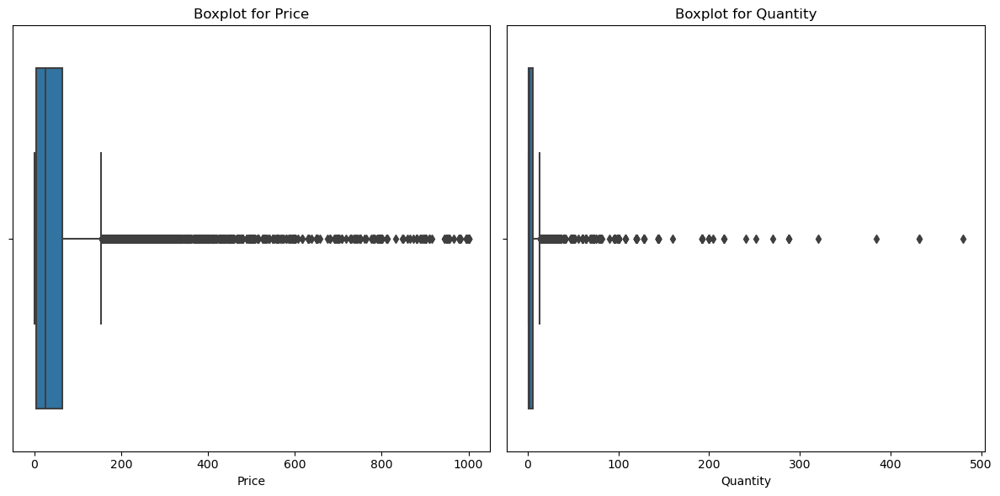

In [246]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x=data['Price'])
plt.title('Boxplot for Price')

plt.subplot(1, 2, 2)
sns.boxplot(x=data['Quantity'])
plt.title('Boxplot for Quantity')

plt.tight_layout()
plt.show()

In [247]:
data = data[data['Quantity'] < 50]

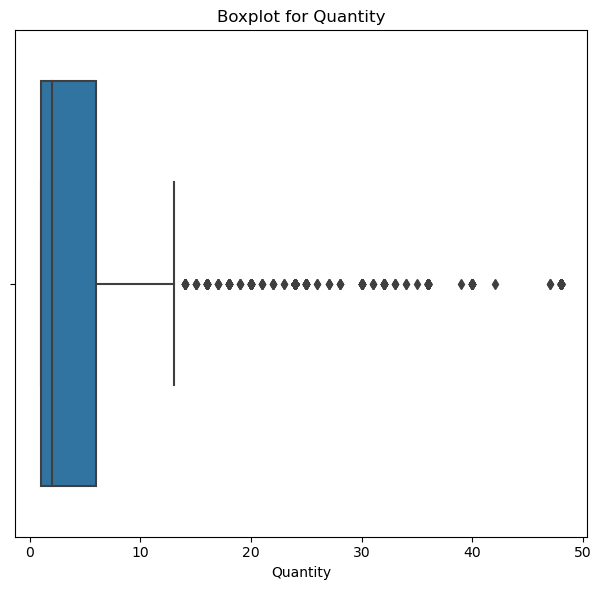

In [248]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
sns.boxplot(x=data['Quantity'])
plt.title('Boxplot for Quantity')
plt.tight_layout()
plt.show()

In [249]:
data['TotalRevenue'] = data['Price'] * data['Quantity']

C:\Users\hp\AppData\Local\Temp\ipykernel_11136\3981999307.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['TotalRevenue'] = data['Price'] * data['Quantity']


In [250]:
data

,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date,TotalRevenue
0,C,Books,80.08,7,Cash,R,2023-12-26 12:32:00,560.56
1,C,Home Decor,75.20,4,Cash,R,2023-08-05 00:00:00,300.80
2,A,Books,31.53,8,Cash,R,2024-03-11 18:51:00,252.24
3,D,Books,98.88,5,PayPal,R,2023-10-27 22:00:00,494.40
4,A,Electronics,93.19,7,Cash,R,2023-12-22 11:38:00,652.33
...,...,...,...,...,...,...,...,...
29995,711168466,boyfriend jeans,88.00,1,Unknown,O,2017-05-07 10:28:00,88.00
29996,711168467,boyfriend jeans,42.99,1,Unknown,O,2018-08-25 12:02:00,42.99
29997,711168468,boyfriend jeans,178.00,1,Unknown,O,2019-11-14 11:07:00,178.00
29998,711168469,boyfriend jeans,66.99,1,Unknown,O,2019-10-15 12:44:00,66.99


In [251]:
median_price = data['Price'].median()
data['PriceCategory'] = data['Price'].apply(lambda x: 'High' if x > median_price else 'Low')

data

C:\Users\hp\AppData\Local\Temp\ipykernel_11136\3422164679.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['PriceCategory'] = data['Price'].apply(lambda x: 'High' if x > median_price else 'Low')


,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date,TotalRevenue,PriceCategory
0,C,Books,80.08,7,Cash,R,2023-12-26 12:32:00,560.56,High
1,C,Home Decor,75.20,4,Cash,R,2023-08-05 00:00:00,300.80,High
2,A,Books,31.53,8,Cash,R,2024-03-11 18:51:00,252.24,High
3,D,Books,98.88,5,PayPal,R,2023-10-27 22:00:00,494.40,High
4,A,Electronics,93.19,7,Cash,R,2023-12-22 11:38:00,652.33,High
...,...,...,...,...,...,...,...,...,...
29995,711168466,boyfriend jeans,88.00,1,Unknown,O,2017-05-07 10:28:00,88.00,High
29996,711168467,boyfriend jeans,42.99,1,Unknown,O,2018-08-25 12:02:00,42.99,High
29997,711168468,boyfriend jeans,178.00,1,Unknown,O,2019-11-14 11:07:00,178.00,High
29998,711168469,boyfriend jeans,66.99,1,Unknown,O,2019-10-15 12:44:00,66.99,High


In [252]:
data['Month'] = data['Date'].dt.month
data['Season'] = data['Date'].dt.month % 12 // 3 + 1  # Spring, Summer, Fall, Winter


# Map numeric values to season names
season_mapping = {1: 'Spring', 2: 'Summer', 3: 'Fall', 4: 'Winter'}
data['SeasonName'] = data['Season'].map(season_mapping)

data



C:\Users\hp\AppData\Local\Temp\ipykernel_11136\3305633038.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Month'] = data['Date'].dt.month
C:\Users\hp\AppData\Local\Temp\ipykernel_11136\3305633038.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Season'] = data['Date'].dt.month % 12 // 3 + 1  # Spring, Summer, Fall, Winter
C:\Users\hp\AppData\Local\Temp\ipykernel_11136\3305633038.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date,TotalRevenue,PriceCategory,Month,Season,SeasonName
0,C,Books,80.08,7,Cash,R,2023-12-26 12:32:00,560.56,High,12,1,Spring
1,C,Home Decor,75.20,4,Cash,R,2023-08-05 00:00:00,300.80,High,8,3,Fall
2,A,Books,31.53,8,Cash,R,2024-03-11 18:51:00,252.24,High,3,2,Summer
3,D,Books,98.88,5,PayPal,R,2023-10-27 22:00:00,494.40,High,10,4,Winter
4,A,Electronics,93.19,7,Cash,R,2023-12-22 11:38:00,652.33,High,12,1,Spring
...,...,...,...,...,...,...,...,...,...,...,...,...
29995,711168466,boyfriend jeans,88.00,1,Unknown,O,2017-05-07 10:28:00,88.00,High,5,2,Summer
29996,711168467,boyfriend jeans,42.99,1,Unknown,O,2018-08-25 12:02:00,42.99,High,8,3,Fall
29997,711168468,boyfriend jeans,178.00,1,Unknown,O,2019-11-14 11:07:00,178.00,High,11,4,Winter
29998,711168469,boyfriend jeans,66.99,1,Unknown,O,2019-10-15 12:44:00,66.99,High,10,4,Winter


In [253]:
product_popularity = data['ProductID'].value_counts().to_dict()
data['ProductPopularity'] = data['ProductID'].map(product_popularity)


C:\Users\hp\AppData\Local\Temp\ipykernel_11136\123300196.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['ProductPopularity'] = data['ProductID'].map(product_popularity)


In [254]:
data

,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date,TotalRevenue,PriceCategory,Month,Season,SeasonName,ProductPopularity
0,C,Books,80.08,7,Cash,R,2023-12-26 12:32:00,560.56,High,12,1,Spring,2531
1,C,Home Decor,75.20,4,Cash,R,2023-08-05 00:00:00,300.80,High,8,3,Fall,2531
2,A,Books,31.53,8,Cash,R,2024-03-11 18:51:00,252.24,High,3,2,Summer,2502
3,D,Books,98.88,5,PayPal,R,2023-10-27 22:00:00,494.40,High,10,4,Winter,2500
4,A,Electronics,93.19,7,Cash,R,2023-12-22 11:38:00,652.33,High,12,1,Spring,2502
...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,711168466,boyfriend jeans,88.00,1,Unknown,O,2017-05-07 10:28:00,88.00,High,5,2,Summer,1
29996,711168467,boyfriend jeans,42.99,1,Unknown,O,2018-08-25 12:02:00,42.99,High,8,3,Fall,1
29997,711168468,boyfriend jeans,178.00,1,Unknown,O,2019-11-14 11:07:00,178.00,High,11,4,Winter,1
29998,711168469,boyfriend jeans,66.99,1,Unknown,O,2019-10-15 12:44:00,66.99,High,10,4,Winter,1


In [255]:
# Remove the 'Season' column
data = data.drop(columns=['Season'])

# Rename 'SeasonName' to 'Season'
data = data.rename(columns={'SeasonName': 'Season'})


In [256]:
data

,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date,TotalRevenue,PriceCategory,Month,Season,ProductPopularity
0,C,Books,80.08,7,Cash,R,2023-12-26 12:32:00,560.56,High,12,Spring,2531
1,C,Home Decor,75.20,4,Cash,R,2023-08-05 00:00:00,300.80,High,8,Fall,2531
2,A,Books,31.53,8,Cash,R,2024-03-11 18:51:00,252.24,High,3,Summer,2502
3,D,Books,98.88,5,PayPal,R,2023-10-27 22:00:00,494.40,High,10,Winter,2500
4,A,Electronics,93.19,7,Cash,R,2023-12-22 11:38:00,652.33,High,12,Spring,2502
...,...,...,...,...,...,...,...,...,...,...,...,...
29995,711168466,boyfriend jeans,88.00,1,Unknown,O,2017-05-07 10:28:00,88.00,High,5,Summer,1
29996,711168467,boyfriend jeans,42.99,1,Unknown,O,2018-08-25 12:02:00,42.99,High,8,Fall,1
29997,711168468,boyfriend jeans,178.00,1,Unknown,O,2019-11-14 11:07:00,178.00,High,11,Winter,1
29998,711168469,boyfriend jeans,66.99,1,Unknown,O,2019-10-15 12:44:00,66.99,High,10,Winter,1


In [257]:
data = data.drop(columns=['Month'])

In [258]:
data

,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date,TotalRevenue,PriceCategory,Season,ProductPopularity
0,C,Books,80.08,7,Cash,R,2023-12-26 12:32:00,560.56,High,Spring,2531
1,C,Home Decor,75.20,4,Cash,R,2023-08-05 00:00:00,300.80,High,Fall,2531
2,A,Books,31.53,8,Cash,R,2024-03-11 18:51:00,252.24,High,Summer,2502
3,D,Books,98.88,5,PayPal,R,2023-10-27 22:00:00,494.40,High,Winter,2500
4,A,Electronics,93.19,7,Cash,R,2023-12-22 11:38:00,652.33,High,Spring,2502
...,...,...,...,...,...,...,...,...,...,...,...
29995,711168466,boyfriend jeans,88.00,1,Unknown,O,2017-05-07 10:28:00,88.00,High,Summer,1
29996,711168467,boyfriend jeans,42.99,1,Unknown,O,2018-08-25 12:02:00,42.99,High,Fall,1
29997,711168468,boyfriend jeans,178.00,1,Unknown,O,2019-11-14 11:07:00,178.00,High,Winter,1
29998,711168469,boyfriend jeans,66.99,1,Unknown,O,2019-10-15 12:44:00,66.99,High,Winter,1


In [259]:
scaler = StandardScaler()
data['Price_standardized'] = scaler.fit_transform(data[['Price']])
data

,ProductID,ProductTitle,Price,Quantity,PaymentMethod,OnlineOrRetail,Date,TotalRevenue,PriceCategory,Season,ProductPopularity,Price_standardized
0,C,Books,80.08,7,Cash,R,2023-12-26 12:32:00,560.56,High,Spring,2531,0.364478
1,C,Home Decor,75.20,4,Cash,R,2023-08-05 00:00:00,300.80,High,Fall,2531,0.306609
2,A,Books,31.53,8,Cash,R,2024-03-11 18:51:00,252.24,High,Summer,2502,-0.211240
3,D,Books,98.88,5,PayPal,R,2023-10-27 22:00:00,494.40,High,Winter,2500,0.587413
4,A,Electronics,93.19,7,Cash,R,2023-12-22 11:38:00,652.33,High,Spring,2502,0.519939
...,...,...,...,...,...,...,...,...,...,...,...,...
29995,711168466,boyfriend jeans,88.00,1,Unknown,O,2017-05-07 10:28:00,88.00,High,Summer,1,0.458395
29996,711168467,boyfriend jeans,42.99,1,Unknown,O,2018-08-25 12:02:00,42.99,High,Fall,1,-0.075345
29997,711168468,boyfriend jeans,178.00,1,Unknown,O,2019-11-14 11:07:00,178.00,High,Winter,1,1.525637
29998,711168469,boyfriend jeans,66.99,1,Unknown,O,2019-10-15 12:44:00,66.99,High,Winter,1,0.209253


# PCA

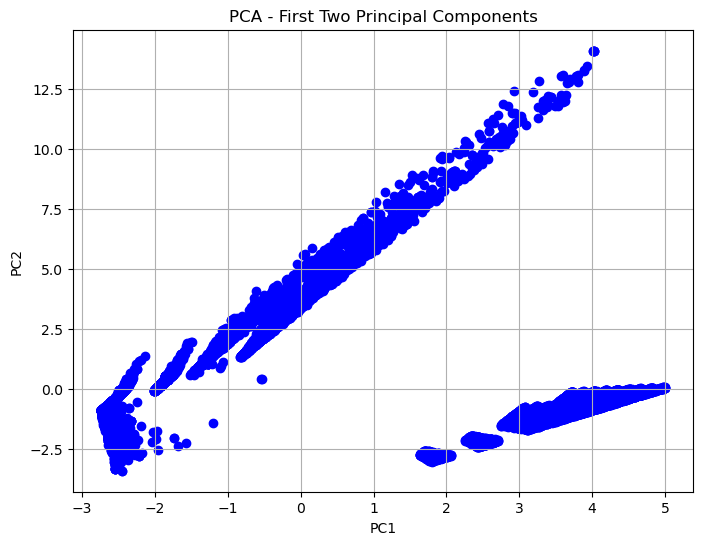

(array([0.0032646 , 0.00488055, 0.00572201, ..., 1.        , 1.        ,
        1.        ]),
 2111)

In [260]:
data_encoded = pd.get_dummies(data.drop(['ProductID', 'Date'], axis=1))

scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_encoded)

pca = PCA()
pca.fit(data_scaled)

explained_variance = np.cumsum(pca.explained_variance_ratio_)

# Selecting enough components to explain ~95% of the variance
n_components = np.argmax(explained_variance >= 0.95) + 1
pca_reduced = PCA(n_components=n_components)
data_pca = pca_reduced.fit_transform(data_scaled)

# Step 4: Visualizing the first two principal components
plt.figure(figsize=(8, 6))
plt.scatter(data_pca[:, 0], data_pca[:, 1], c='blue', marker='o')
plt.title("PCA - First Two Principal Components")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.grid(True)
plt.show()

# Output the results for explained variance and number of components chosen
explained_variance, n_components


# CLV based on ProductTitle and PriceCategory segmentation

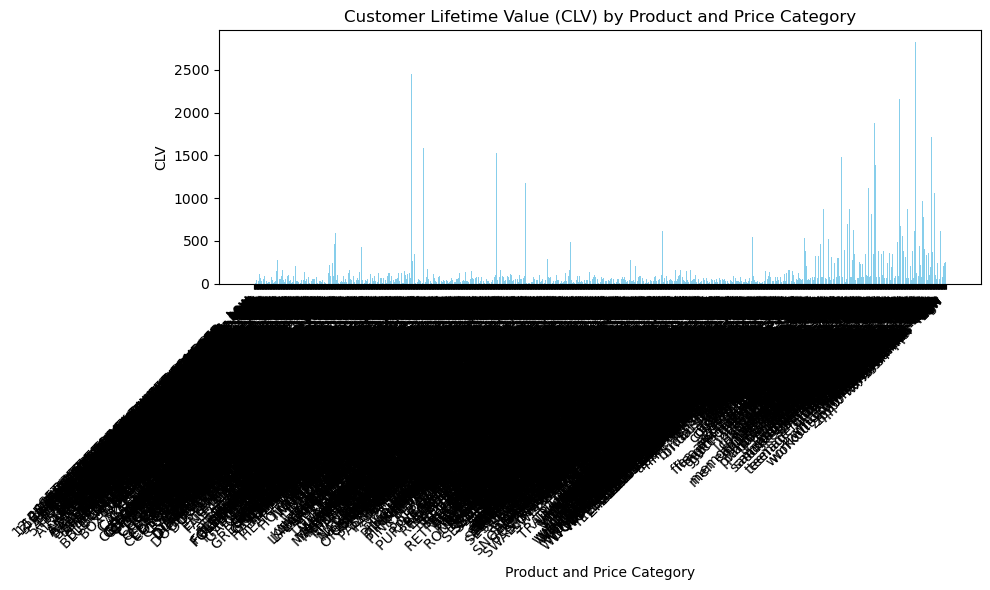

,ProductTitle,PriceCategory,AvgPurchaseValue,CLV
0,4 PURPLE FLOCK DINNER CANDLES,Low,17.850000,89.250000
2,SET 2 TEA TOWELS I LOVE LONDON,Low,12.245000,61.225000
3,10 COLOUR SPACEBOY PEN,Low,11.374167,56.870833
4,12 COLOURED PARTY BALLOONS,Low,5.633333,28.166667
5,12 DAISY PEGS IN WOOD BOX,Low,2.640000,13.200000
...,...,...,...,...
2416,yoga pants,High,48.965152,244.825758
2417,yoga pants,Low,20.086471,100.432353
2419,zippo,Low,12.118261,60.591304
2420,zippo hand warmer,High,51.530000,257.650000


In [263]:
grouped_data = data.groupby(['ProductTitle', 'PriceCategory']).agg({
    'TotalRevenue': 'sum',
    'ProductID': 'count'  # This will give us the number of purchases in each segment
}).reset_index()

grouped_data = grouped_data[grouped_data['ProductID'] > 1]

grouped_data['AvgPurchaseValue'] = grouped_data['TotalRevenue'] / grouped_data['ProductID']


# Retention Rate assumption: we assume 80% retention rate (can vary)
retention_rate = 0.8
churn_rate = 1 - retention_rate

grouped_data['CLV'] = grouped_data['AvgPurchaseValue'] * 1 * (1 / churn_rate)

plt.figure(figsize=(10, 6))
plt.bar(grouped_data['ProductTitle'] + " - " + grouped_data['PriceCategory'], grouped_data['CLV'], color='skyblue')
plt.title("Customer Lifetime Value (CLV) by Product and Price Category")
plt.xlabel("Product and Price Category")
plt.ylabel("CLV")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

grouped_data[['ProductTitle', 'PriceCategory', 'AvgPurchaseValue', 'CLV']]

# What-if Analysis

In [265]:
percentages = [0.10, 0.20, 0.30]
results = []

# Perform what-if analysis
for percent in percentages:
    for idx, row in data.iterrows():
        new_atv = row['Price'] * (1 + percent)
        new_total_revenue = new_atv * row['Quantity']
        results.append({
            'ProductTitle': row['ProductTitle'],
            'PercentageIncrease': percent,
            'NewATV': new_atv,
            'NewTotalRevenue': new_total_revenue
        })

results_df = pd.DataFrame(results)

# Plot results
plt.figure(figsize=(10, 6))
for title in results_df['ProductTitle'].unique():
    subset = results_df[results_df['ProductTitle'] == title]
    plt.plot(subset['PercentageIncrease'], subset['NewTotalRevenue'], label=title)

plt.xlabel('Percentage Increase in ATV')
plt.ylabel('New Total Revenue')
plt.title('Impact of ATV Increase on Total Revenue')

# Adjust the legend location
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))  # Place legend outside the plot
plt.grid(True)

# Adjust layout to make room for the legend
plt.tight_layout()

plt.show()

C:\Users\hp\AppData\Local\Temp\ipykernel_11136\2834632982.py:33: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


# More Insights

C:\Users\hp\AppData\Local\Temp\ipykernel_11136\2187565039.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  retailpie['PaymentMethod'] = retailpie['PaymentMethod'].replace({'Debit Card': 'CARD PAYMENTS', 'Credit Card': 'CARD PAYMENTS'})


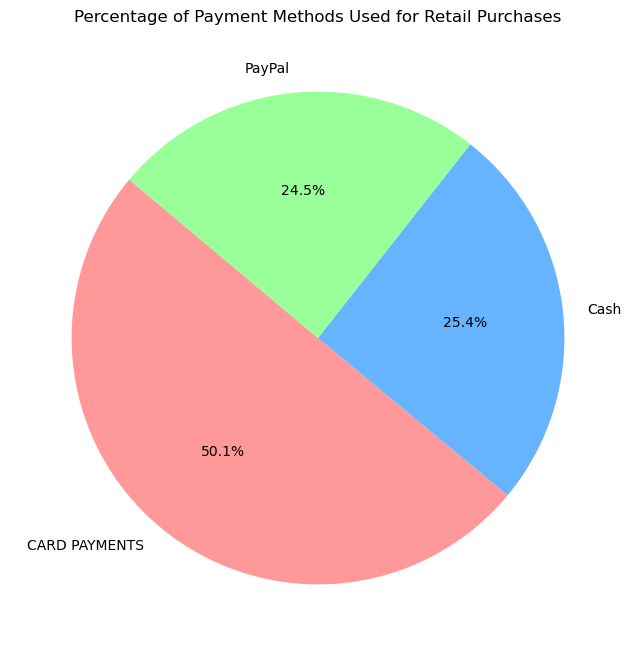

In [269]:
retailpie = data[data['OnlineOrRetail'] == 'R']

# Merge Debit Card and Credit Card into CARD PAYMENTS
retailpie['PaymentMethod'] = retailpie['PaymentMethod'].replace({'Debit Card': 'CARD PAYMENTS', 'Credit Card': 'CARD PAYMENTS'})

# Count occurrences of each Payment Method
payment_method_counts = retailpie['PaymentMethod'].value_counts()

# Plot pie chart
plt.figure(figsize=(8, 8))
plt.pie(payment_method_counts, labels=payment_method_counts.index, autopct='%1.1f%%', startangle=140, colors=['#ff9999', '#66b3ff', '#99ff99', '#ffcc99'])
plt.title('Percentage of Payment Methods Used for Retail Purchases')
plt.show()

In Retail purchases Card Payments are done more than Cash Payments maybe because people purchase them in bulk.

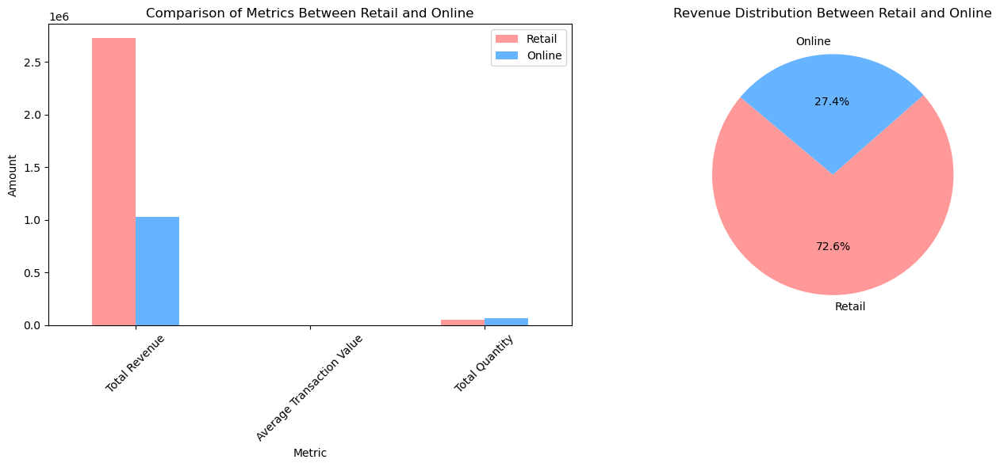

In [267]:
def aggregate_data(df):
    return {
        'TotalRevenue': df['TotalRevenue'].sum(),
        'AverageTransactionValue': (df['TotalRevenue'] / df['Quantity']).mean(),
        'TotalQuantity': df['Quantity'].sum()
    }

# Filter and calculate metrics for retail and online
retails_df = data[data['OnlineOrRetail'] == 'R']
online_df = data[data['OnlineOrRetail'] == 'O']

retail_metrics = aggregate_data(retails_df)
online_metrics = aggregate_data(online_df)

# Create DataFrames for plotting
metrics_df = pd.DataFrame({
    'Metric': ['Total Revenue', 'Average Transaction Value', 'Total Quantity'],
    'Retail': [retail_metrics['TotalRevenue'], retail_metrics['AverageTransactionValue'], retail_metrics['TotalQuantity']],
    'Online': [online_metrics['TotalRevenue'], online_metrics['AverageTransactionValue'], online_metrics['TotalQuantity']]
})

# Plot bar charts
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Bar chart for total revenue and average transaction value
metrics_df.plot(kind='bar', x='Metric', y=['Retail', 'Online'], ax=ax[0], color=['#ff9999', '#66b3ff'], legend=True)
ax[0].set_title('Comparison of Metrics Between Retail and Online')
ax[0].set_ylabel('Amount')
ax[0].set_xlabel('Metric')
ax[0].set_xticklabels(metrics_df['Metric'], rotation=45)

# Pie chart for revenue distribution
revenue_distribution = pd.Series({
    'Retail': retail_metrics['TotalRevenue'],
    'Online': online_metrics['TotalRevenue']
})

ax[1].pie(revenue_distribution, labels=revenue_distribution.index, autopct='%1.1f%%', startangle=140, colors=['#ff9999','#66b3ff'])
ax[1].set_title('Revenue Distribution Between Retail and Online')

plt.tight_layout()
plt.show()

Retail generates more revenue on Less Quantity

<Figure size 1200x600 with 0 Axes>

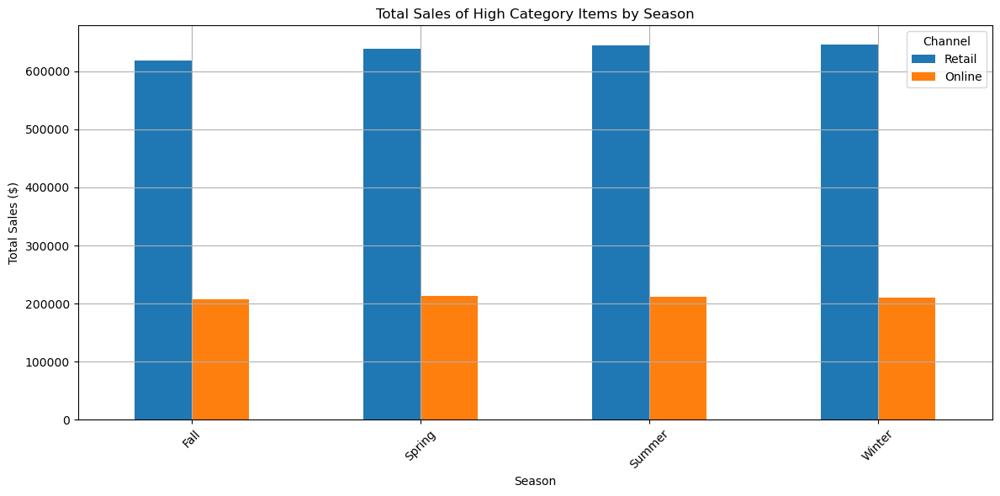

In [270]:
high_category_df = data[data['PriceCategory'] == 'High']

# Separate into retail and online
retails_df = high_category_df[high_category_df['OnlineOrRetail'] == 'R']
online_df = high_category_df[high_category_df['OnlineOrRetail'] == 'O']

# Aggregate sales by season
def aggregate_sales_by_season(df):
    return df.groupby('Season')['TotalRevenue'].sum().sort_index()

retail_season_sales = aggregate_sales_by_season(retails_df)
online_season_sales = aggregate_sales_by_season(online_df)

# Create DataFrames for plotting
season_comparison_df = pd.DataFrame({
    'Retail': retail_season_sales,
    'Online': online_season_sales
}).fillna(0)  # Fill NaN values with 0 for seasons with no sales

# Plot bar charts
plt.figure(figsize=(12, 6))
season_comparison_df.plot(kind='bar', figsize=(12, 6))
plt.title('Total Sales of High Category Items by Season')
plt.ylabel('Total Sales ($)')
plt.xlabel('Season')
plt.xticks(rotation=45)
plt.legend(title='Channel')
plt.grid(True)
plt.tight_layout()
plt.show()